In [1]:
import numpy as np
import matplotlib.pyplot as plt
import imageio

In [2]:
def tileset(name):
    with open('../tilesets/armageddon-tilesets/Data/%s.pi' % name, 'rb') as file:
        data = file.read()

    with open('../tilesets/armageddon-tilesets/Palette/%s.pal' % name, 'rb') as file:
        palette = file.read()

    palette = np.frombuffer(palette, dtype=np.uint8).reshape([-1, 4])
    palette = palette[:, :3]
    
    paletted_data = np.array(list(map(lambda x: palette[x], data)))
    
    return paletted_data[24:].reshape([-1, 32, 32, 3])

In [3]:
def show_tiles(tiles):
    array_height, array_width = tiles.shape[0: 2]
    tile_graphics = tiles[0, 0]
    tile_width, tile_height, *remaining = tile_graphics.shape
    result_width = array_width * tile_width
    result_height = array_height * tile_height

    result = np.zeros([result_height, result_width, *remaining], dtype=np.uint8)

    for x in range(0, result_height, tile_height):
        for y in range(0, result_width, tile_width):
            result[x:x+tile_height, y:y+tile_width] = tiles[x // tile_height, y // tile_width]

    plt.figure(figsize=(array_width, array_height), dpi=32, tight_layout={'pad': 0, 'w_pad': 0, 'h_pad': 0}, frameon=False)
    plt.axis('off')
    fig = plt.imshow(result)

def show_sequence(tiles, start_index, width, height):
    tiles = tiles[start_index: start_index + width*height].reshape(height, width, 32, 32, 3)
    show_tiles(tiles)

empty_tile = np.zeros((32, 32, 3))

def row(tiles, start, length):
    return tiles[start: start + length]

def show_rows(*rows):
    show_tiles(np.array(rows))

In [4]:
tiles = tileset('ead')

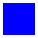

In [6]:
show_sequence(tiles, 0, 1, 1)

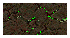

In [49]:
show_sequence(tiles, 1, 2, 1)

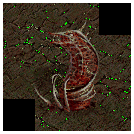

In [48]:
show_rows(
    [*row(tiles, 3, 3), empty_tile],
    row(tiles, 6, 4),
    row(tiles, 10, 4),
    [empty_tile, *row(tiles, 14, 3)],
)

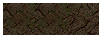

In [51]:
show_sequence(tiles, 17, 3, 1)

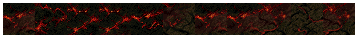

In [55]:
show_sequence(tiles, 20, 11, 1)

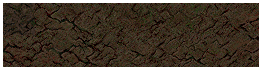

In [65]:
show_sequence(tiles, 31, 8, 2)

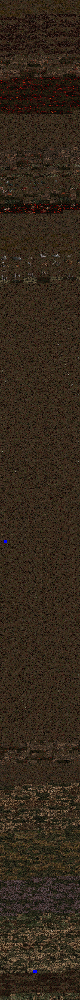

In [67]:
show_sequence(tiles, 47, 24, 300)